In [1]:
#Libraries
import pandas as pd
import numpy as np
import matplotlib as plt
import seaborn as sns
import datetime
from datetime import datetime
import plotly.express as px
import plotly.graph_objects as go


C:\ProgramData\Anaconda3\lib\site-packages\scipy\__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "


In [2]:
#datasets import for first 3 months of 2022 
df1 = pd.read_parquet(r"C:\Users\Kushan\OneDrive\Desktop\Project\yellow_tripdata_2022-01 (1).parquet",engine='auto')
df2 = pd.read_parquet(r"C:\Users\Kushan\OneDrive\Desktop\Project\yellow_tripdata_2022-02.parquet",engine='auto')
df3 = pd.read_parquet(r"C:\Users\Kushan\OneDrive\Desktop\Project\yellow_tripdata_2022-03.parquet",engine='auto')
df7 = pd.read_parquet(r"C:\Users\Kushan\OneDrive\Desktop\Project\fhvhv_tripdata_2022-01.parquet",engine='auto')
df8 = pd.read_parquet(r"C:\Users\Kushan\OneDrive\Desktop\Project\fhvhv_tripdata_2022-02.parquet",engine='auto')
df9 = pd.read_parquet(r"C:\Users\Kushan\OneDrive\Desktop\Project\fhvhv_tripdata_2022-03.parquet",engine='auto')



In [3]:
# Printing the shape and information of all the loaded datasets
print(df1.info())
print(df1.shape)
print(df2.info())
print(df2.shape)
print(df3.info())
print(df3.shape)
print(df7.info())
print(df7.shape)
print(df8.info())
print(df8.shape)
print(df9.info())
print(df9.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2463931 entries, 0 to 2463930
Data columns (total 19 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   VendorID               int64         
 1   tpep_pickup_datetime   datetime64[ns]
 2   tpep_dropoff_datetime  datetime64[ns]
 3   passenger_count        float64       
 4   trip_distance          float64       
 5   RatecodeID             float64       
 6   store_and_fwd_flag     object        
 7   PULocationID           int64         
 8   DOLocationID           int64         
 9   payment_type           int64         
 10  fare_amount            float64       
 11  extra                  float64       
 12  mta_tax                float64       
 13  tip_amount             float64       
 14  tolls_amount           float64       
 15  improvement_surcharge  float64       
 16  total_amount           float64       
 17  congestion_surcharge   float64       
 18  airport_fee           

In [4]:
#Data Cleaning changing names of some of the columns and added extra columns to make these datasets similar 
df1.rename(columns = {'tpep_dropoff_datetime':'dropoff_datetime'}, inplace = True) 
df1.rename(columns = {'tpep_pickup_datetime':'pickup_datetime'}, inplace = True) 
df2.rename(columns = {'tpep_dropoff_datetime':'dropoff_datetime'}, inplace = True) 
df2.rename(columns = {'tpep_pickup_datetime':'pickup_datetime'}, inplace = True) 
df3.rename(columns = {'tpep_dropoff_datetime':'dropoff_datetime'}, inplace = True) 
df3.rename(columns = {'tpep_pickup_datetime':'pickup_datetime'}, inplace = True) 
df1['cab_type']="yellow"
df2['cab_type']="yellow"
df3['cab_type']="yellow"
def change(rows, values):
    return values[rows]
values = {'HV0002': 'Juno', 'HV0003': 'Uber', 'HV0004': 'Via', 'HV0005': 'Lyft'}
df7['cab_type'] = df7['hvfhs_license_num'].apply(change, args = (values,))
df8['cab_type'] = df8['hvfhs_license_num'].apply(change, args = (values,))
df9['cab_type'] = df9['hvfhs_license_num'].apply(change, args = (values,))
#Matching total amount for both datasets
df7['total_amount'] = df7['base_passenger_fare']+df7['tolls']+df7['sales_tax']+df7['congestion_surcharge']+df7['airport_fee']
df8['total_amount'] = df8['base_passenger_fare']+df8['tolls']+df8['sales_tax']+df8['congestion_surcharge']+df8['airport_fee']
df9['total_amount'] = df9['base_passenger_fare']+df9['tolls']+df9['sales_tax']+df9['congestion_surcharge']+df9['airport_fee']
df1['total_amount'] = df1['total_amount']-df1['tip_amount']
df2['total_amount'] = df2['total_amount']-df2['tip_amount']
df3['total_amount'] = df3['total_amount']-df3['tip_amount']

In [5]:
#Renaming Columns
df7.rename(columns = {'trip_miles':'trip_distance'}, inplace = True) 
df7.rename(columns = {'tips':'tip_amount'}, inplace = True) 
df8.rename(columns = {'trip_miles':'trip_distance'}, inplace = True) 
df8.rename(columns = {'tips':'tip_amount'}, inplace = True) 
df9.rename(columns = {'trip_miles':'trip_distance'}, inplace = True) 
df9.rename(columns = {'tips':'tip_amount'}, inplace = True)
df1.rename(columns = {'fare_amount':'base_passenger_fare'}, inplace = True) 
df2.rename(columns = {'fare_amount':'base_passenger_fare'}, inplace = True)
df3.rename(columns = {'fare_amount':'base_passenger_fare'}, inplace = True) 

In [6]:
#dropping unwanted columns
df1=df1.drop(['VendorID','airport_fee','tolls_amount','extra','mta_tax','passenger_count','store_and_fwd_flag','improvement_surcharge','RatecodeID','payment_type'],axis=1)
df2=df2.drop(['VendorID','airport_fee','tolls_amount','extra','mta_tax','passenger_count','store_and_fwd_flag','improvement_surcharge','RatecodeID','payment_type'],axis=1)
df3=df3.drop(['VendorID','airport_fee','tolls_amount','extra','mta_tax','passenger_count','store_and_fwd_flag','improvement_surcharge','RatecodeID','payment_type'],axis=1)
df7 = df7.drop(['dispatching_base_num','hvfhs_license_num','shared_request_flag','shared_match_flag','access_a_ride_flag','wav_request_flag','wav_match_flag','originating_base_num','request_datetime','on_scene_datetime','trip_time','bcf','tolls'], axis=1)
df8 = df8.drop(['dispatching_base_num','hvfhs_license_num','shared_request_flag','shared_match_flag','access_a_ride_flag','wav_request_flag','wav_match_flag','originating_base_num','request_datetime','on_scene_datetime','trip_time','bcf','tolls'], axis=1)
df9 = df9.drop(['dispatching_base_num','hvfhs_license_num','shared_request_flag','shared_match_flag','access_a_ride_flag','wav_request_flag','wav_match_flag','originating_base_num','request_datetime','on_scene_datetime','trip_time','bcf','tolls'], axis=1)

In [7]:
#Handling Negatives(Dataset had some negative values in them making them positive with abstract function)
df1['total_amount'] = df1['total_amount'].abs()
df1['congestion_surcharge'] = df1['congestion_surcharge'].abs()
df1['base_passenger_fare'] = df1['base_passenger_fare'].abs()
df2['total_amount'] = df2['total_amount'].abs()
df2['congestion_surcharge'] = df2['congestion_surcharge'].abs()
df2['base_passenger_fare'] = df2['base_passenger_fare'].abs()
df3['total_amount'] = df3['total_amount'].abs()
df3['congestion_surcharge'] = df3['congestion_surcharge'].abs()
df3['base_passenger_fare'] = df3['base_passenger_fare'].abs()




In [2]:
#Loading weather data(Downloaded from meteostat )
weather = pd.read_csv(r"C:\Users\Kushan\Downloads\export.csv")

In [9]:
# Finding the intesection between dataset of yellow and hvfs dataset
np.intersect1d(df1.columns,df7.columns)

array(['DOLocationID', 'PULocationID', 'base_passenger_fare', 'cab_type',
       'congestion_surcharge', 'dropoff_datetime', 'pickup_datetime',
       'tip_amount', 'total_amount', 'trip_distance'], dtype=object)

In [10]:
#Removing extra columns 
df7=df7.drop(['driver_pay','airport_fee','sales_tax'],axis=1)
df8=df8.drop(['driver_pay','airport_fee','sales_tax'],axis=1)
df9=df9.drop(['driver_pay','airport_fee','sales_tax'],axis=1)


In [11]:
# Finding null values in dataframe of yellow cabs
df1.isnull().sum()
df2.isnull().sum()
df3.isnull().sum()

pickup_datetime              0
dropoff_datetime             0
trip_distance                0
PULocationID                 0
DOLocationID                 0
base_passenger_fare          0
tip_amount                   0
total_amount                 0
congestion_surcharge    117814
cab_type                     0
dtype: int64

In [12]:
# Finding null values in dataframe of hvf cabs
df7.isnull().sum()
df8.isnull().sum()
df9.isnull().sum()


pickup_datetime         0
dropoff_datetime        0
PULocationID            0
DOLocationID            0
trip_distance           0
base_passenger_fare     0
congestion_surcharge    0
tip_amount              0
cab_type                0
total_amount            0
dtype: int64

In [13]:
df1[df1['congestion_surcharge'].isna()]

,pickup_datetime,dropoff_datetime,trip_distance,PULocationID,DOLocationID,base_passenger_fare,tip_amount,total_amount,congestion_surcharge,cab_type
2392428,2022-01-01 00:50:00,2022-01-01 00:54:00,1.00,68,246,13.20,1.75,16.50,NaN,yellow
2392429,2022-01-01 00:49:24,2022-01-01 01:27:36,13.31,257,223,44.87,10.05,45.67,NaN,yellow
2392430,2022-01-01 00:42:00,2022-01-01 00:56:00,2.87,143,236,13.23,3.51,16.53,NaN,yellow
2392431,2022-01-01 00:40:00,2022-01-01 00:55:00,3.24,143,262,14.19,3.72,17.49,NaN,yellow
2392432,2022-01-01 00:40:00,2022-01-01 00:52:00,2.19,239,166,13.20,5.25,16.50,NaN,yellow
...,...,...,...,...,...,...,...,...,...,...
2463926,2022-01-31 23:36:53,2022-01-31 23:42:51,1.32,90,170,8.00,2.39,11.30,NaN,yellow
2463927,2022-01-31 23:44:22,2022-01-31 23:55:01,4.19,107,75,16.80,4.35,20.10,NaN,yellow
2463928,2022-01-31 23:39:00,2022-01-31 23:50:00,2.10,113,246,11.22,2.00,14.52,NaN,yellow
2463929,2022-01-31 23:36:42,2022-01-31 23:48:45,2.92,148,164,12.40,0.00,15.70,NaN,yellow


In [14]:
#Handling null values of yellow cabs datafranes
df1['congestion_surcharge'] = df1['congestion_surcharge'].fillna(0)
df2['congestion_surcharge'] = df2['congestion_surcharge'].fillna(0)
df3['congestion_surcharge'] = df3['congestion_surcharge'].fillna(0)



In [15]:
# Concating all the data frame into one 
data =pd.concat([df1,df2,df3,df7,df8,df9], axis=0, ignore_index=True)


In [16]:
#Finding the datatypes and memory usage for the above dataset
data.info(memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58295666 entries, 0 to 58295665
Data columns (total 10 columns):
 #   Column                Dtype         
---  ------                -----         
 0   pickup_datetime       datetime64[ns]
 1   dropoff_datetime      datetime64[ns]
 2   trip_distance         float64       
 3   PULocationID          int64         
 4   DOLocationID          int64         
 5   base_passenger_fare   float64       
 6   tip_amount            float64       
 7   total_amount          float64       
 8   congestion_surcharge  float64       
 9   cab_type              object        
dtypes: datetime64[ns](2), float64(5), int64(2), object(1)
memory usage: 7.2 GB


In [17]:
#Adding new Columns for time frames
data['Month']=data['pickup_datetime'].dt.month_name()
data['Day']=data['pickup_datetime'].dt.day_name()
data['Hour']=data['pickup_datetime'].dt.hour
data['Date']=data['pickup_datetime'].dt.date

In [27]:
# Saved parquet of concated dataset
data.to_parquet('data.parquet', engine='auto')

In [3]:
# Reading the concated dataset
data=pd.read_parquet('data.parquet',engine='auto')

In [19]:
data.shape

(58295666, 14)

In [20]:
data.head()

,pickup_datetime,dropoff_datetime,trip_distance,PULocationID,DOLocationID,base_passenger_fare,tip_amount,total_amount,congestion_surcharge,cab_type,Month,Day,Hour,Date
0,2022-01-01 00:35:40,2022-01-01 00:53:29,3.80,142,236,14.5,3.65,18.3,2.5,yellow,January,Saturday,0,2022-01-01
1,2022-01-01 00:33:43,2022-01-01 00:42:07,2.10,236,42,8.0,4.00,9.3,0.0,yellow,January,Saturday,0,2022-01-01
2,2022-01-01 00:53:21,2022-01-01 01:02:19,0.97,166,166,7.5,1.76,8.8,0.0,yellow,January,Saturday,0,2022-01-01
3,2022-01-01 00:25:21,2022-01-01 00:35:23,1.09,114,68,8.0,0.00,11.8,2.5,yellow,January,Saturday,0,2022-01-01
4,2022-01-01 00:36:48,2022-01-01 01:14:20,4.30,68,163,23.5,3.00,27.3,2.5,yellow,January,Saturday,0,2022-01-01


In [22]:
# Pie chart for rides across 3 months
pie = data['cab_type'].value_counts()

In [23]:
fig = go.Figure(data=[go.Pie(labels=pie.index, values=pie.values)])
fig.show()

In [24]:
# Weather Datasets data types
weather.dtypes

date     object
tavg    float64
tmin    float64
tmax    float64
prcp    float64
snow    float64
wdir    float64
wspd    float64
wpgt    float64
pres    float64
tsun    float64
dtype: object

In [25]:
# Plotting daily ridership of the cabs 
Uber_daily = data[data['cab_type'] == 'Uber']['Day'].value_counts()
Uber_daily = Uber_daily.reindex(index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday','Saturday','Sunday'])
lyft_daily = data[data['cab_type'] == 'Lyft']['Day'].value_counts()
lyft_daily = lyft_daily.reindex(index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday','Saturday','Sunday'])
Yellow_daily = data[data['cab_type'] == 'yellow']['Day'].value_counts()
Yellow_daily = Yellow_daily.reindex(index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday','Saturday','Sunday'])



In [26]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=Uber_daily.index, y=Uber_daily.values,
                    mode='lines',
                    name='Uber'))
fig.add_trace(go.Scatter(x=lyft_daily.index, y=lyft_daily.values,
                    mode='lines',
                    name='Lyft'))
fig.add_trace(go.Scatter(x=Yellow_daily.index, y=Yellow_daily.values,
                    mode='lines',
                    name='Yellow'))
fig.update_layout(
    title="Daily Ridership",
    xaxis_title="Days",
    yaxis_title="Total Rides",
    legend_title="Cab Type",
    font=dict(
        family="Courier New, monospace",
        size=15,
        color="RebeccaPurple"
    )
)
fig.show()

In [27]:
# Plot ridership during 3months
Uber_Monthly = data[data['cab_type'] == 'Uber']['Month'].value_counts()
Uber_Monthly = Uber_Monthly.reindex(index = ['January', 'February', 'March'])
lyft_Monthly = data[data['cab_type'] == 'Lyft']['Month'].value_counts()
lyft_Monthly = lyft_Monthly.reindex(index = ['January', 'February', 'March'])
Yellow_Monthly = data[data['cab_type'] == 'yellow']['Month'].value_counts()
Yellow_Monthly = Yellow_Monthly.reindex(index = ['January', 'February', 'March'])



In [28]:
fig = go.Figure()
fig.add_trace(go.Bar(x=Uber_Monthly.index, y=Uber_Monthly.values,
              name='Uber'))
fig.add_trace(go.Bar(x=lyft_Monthly.index, y=lyft_Monthly.values,
                    name='Lyft'))
fig.add_trace(go.Bar(x=Yellow_Monthly.index, y=Yellow_Monthly.values,
                   name='Yellow'))

fig.update_layout(barmode='group',title="Monthly Ridership",
    xaxis_title="Months",
    yaxis_title="Total Rides",
    legend_title="Cab Type" )

fig.show()

In [29]:
# Plotting ride distribution for each hour
uber_dist = data[data['cab_type']=='Uber'].groupby('Hour').Hour.count()
lyft_dist = data[data['cab_type']=='Lyft'].groupby('Hour').Hour.count()
yellow_dist = data[data['cab_type']=='yellow'].groupby('Hour').Hour.count()




In [30]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=uber_dist.index, y=uber_dist.values,
                    mode='lines+markers',
                    name='Uber'))
fig.add_trace(go.Scatter(x=lyft_dist.index, y=lyft_dist.values,
                    mode='lines+markers',
                    name='Lyft'))
fig.add_trace(go.Scatter(x=yellow_dist.index, y=yellow_dist.values,
                    mode='lines+markers',
                    name='Yellow'))
fig.update_layout(
    title="Hourly Ridership",
    xaxis_title="Hours",
    yaxis_title="Total Rides",
    legend_title="Cab Type",
  xaxis = dict(tickmode = 'array' ,tickvals = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23])
               
)
fig.show()

In [31]:
# Handling negatives values of data 
data['total_amount'] = data['total_amount'].abs()
data['congestion_surcharge'] = data['congestion_surcharge'].abs()
data['base_passenger_fare'] = data['base_passenger_fare'].abs()
data['tip_amount'] = data['tip_amount'].abs()

In [32]:
data[data['cab_type']=='Uber']['total_amount'].mean()

25.648803421480736

In [33]:
data[data['cab_type']=='Lyft']['total_amount'].mean()

24.40441487831494

In [34]:
data[data['cab_type']=='yellow']['total_amount'].mean()

17.102746562808818

In [35]:
# Filtering Trip distance for trips between 0 to 20 miles
filt = data[(data['trip_distance']==0) |(data['trip_distance']<=21)]


In [36]:
# Plotting the fare and trip distance of fileted dataset
ubp = filt[filt['cab_type']=='Uber'].groupby('trip_distance')['total_amount'].mean()
lyp =filt[filt['cab_type']=='Lyft'].groupby('trip_distance')['total_amount'].mean()
yelp = filt[filt['cab_type']=='yellow'].groupby('trip_distance')['total_amount'].mean()

In [37]:

fig = go.Figure()
fig.add_trace(go.Scatter(x=ubp.index, y=ubp.values,
                    mode='markers',marker=dict(
            color='Red',
            size=20,
            opacity=1,
            line=dict(
                color='MediumPurple',
                width=5
            )
        ),
                    name='Uber'))
fig.add_trace(go.Scatter(x=lyp.index, y=lyp.values,
                    mode='markers',marker=dict(
            color='Pink',
            size=10,
            opacity=1,
            line=dict(
                color='LightBlue',
                width=1
            )
        ),
                    name='Lyft'))
fig.add_trace(go.Scatter(x=yelp.index, y=yelp.values,
                    mode='markers',marker=dict(
            color='Yellow',
            size=10,
            opacity=1,
            line=dict(
                color='Yellow',
                width=1
            )
        ),
                    name='Yellow'))
fig.update_layout(title="Average price per distance",
    xaxis_title="Distance",
    yaxis_title="Fare",
    legend_title="Cab Type" )

fig.show()

In [24]:
data

,pickup_datetime,dropoff_datetime,trip_distance,PULocationID,DOLocationID,base_passenger_fare,tip_amount,total_amount,congestion_surcharge,cab_type,Month,Day,Hour,Date
0,2022-01-01 00:35:40,2022-01-01 00:53:29,3.800,142,236,14.50,3.65,18.30,2.50,yellow,January,Saturday,0,2022-01-01
1,2022-01-01 00:33:43,2022-01-01 00:42:07,2.100,236,42,8.00,4.00,9.30,0.00,yellow,January,Saturday,0,2022-01-01
2,2022-01-01 00:53:21,2022-01-01 01:02:19,0.970,166,166,7.50,1.76,8.80,0.00,yellow,January,Saturday,0,2022-01-01
3,2022-01-01 00:25:21,2022-01-01 00:35:23,1.090,114,68,8.00,0.00,11.80,2.50,yellow,January,Saturday,0,2022-01-01
4,2022-01-01 00:36:48,2022-01-01 01:14:20,4.300,68,163,23.50,3.00,27.30,2.50,yellow,January,Saturday,0,2022-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58295661,2022-03-31 23:56:47,2022-04-01 00:09:52,3.740,112,233,18.39,0.00,29.90,2.75,Uber,March,Thursday,23,2022-03-31
58295662,2022-03-31 23:08:34,2022-03-31 23:22:32,1.950,231,158,18.35,0.00,22.73,2.75,Uber,March,Thursday,23,2022-03-31
58295663,2022-03-31 23:25:20,2022-03-31 23:33:51,2.000,158,48,19.38,0.00,23.85,2.75,Uber,March,Thursday,23,2022-03-31
58295664,2022-03-31 23:47:18,2022-04-01 00:01:57,2.590,85,91,13.40,0.00,14.59,0.00,Uber,March,Thursday,23,2022-03-31


In [38]:
# Plotting average Fare prices for different time in a day
uaf = data[data['cab_type']=='Uber'].groupby('Hour')['total_amount'].mean()
lyaf = data[data['cab_type']=='Lyft'].groupby('Hour')['total_amount'].mean()
yelaf = data[data['cab_type']=='yellow'].groupby('Hour')['total_amount'].mean()



In [39]:

fig = go.Figure()
fig.add_trace(go.Scatter(x=uaf.index, y=uaf.values,
                    mode='lines',
                    name='Uber'))
fig.add_trace(go.Scatter(x=lyaf.index, y=lyaf.values,
                    mode='lines',
                    name='Lyft'))
fig.add_trace(go.Scatter(x=yelaf.index, y=yelaf.values,
                    mode='lines',
                    name='Yellow'))
fig.update_layout(title="Fare Price For Every Hour",
    xaxis_title="Hour",
    yaxis_title="Fare",
    legend_title="Cab Type",
                   xaxis = dict(tickmode = 'array' ,tickvals = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]))

fig.show()

In [40]:
# Plotting average Congestion price charged by cabs for different time in a day
ubercg = data[data['cab_type']=='Uber'].groupby('Hour')['congestion_surcharge'].mean()
lyftcg = data[data['cab_type']=='Lyft'].groupby('Hour')['congestion_surcharge'].mean()
yellowcg = data[data['cab_type']=='yellow'].groupby('Hour')['congestion_surcharge'].mean()



In [41]:

fig = go.Figure()
fig.add_trace(go.Scatter(x=ubercg.index, y=ubercg.values,
                    mode='lines',
                    name='Uber'))
fig.add_trace(go.Scatter(x=lyftcg.index, y=lyftcg.values,
                    mode='lines',
                    name='Lyft'))
fig.add_trace(go.Scatter(x=yellowcg.index, y=yellowcg.values,
                    mode='lines',
                    name='Yellow'))
fig.update_layout(title="Congestion Price For Every Hour",
    xaxis_title="Hour",
    yaxis_title="Congestion Price",
    legend_title="Cab Type",
                   xaxis = dict(tickmode = 'array' ,tickvals = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]))

fig.show()

In [42]:
# Fare charged filtering
index1 = data[ (data['total_amount'] >= 251) | (data['tip_amount'] >= 100)].index
data.drop(index1,inplace=True)

In [43]:
# Plotting average tips per total fare
ubertip = data[data['cab_type']=='Uber'].groupby('tip_amount')['total_amount'].mean()
lyfttip = data[data['cab_type']=='Lyft'].groupby('tip_amount')['total_amount'].mean()
yellowtip = data[data['cab_type']=='yellow'].groupby('tip_amount')['total_amount'].mean()

In [44]:

fig = go.Figure()
fig.add_trace(go.Scatter(x=ubertip.values, y=ubertip.index,
                    mode='markers',
                    name='Uber'))
fig.add_trace(go.Scatter(x=lyfttip.values, y=lyfttip.index,
                    mode='markers',
                    name='Lyft'))
fig.add_trace(go.Scatter(x=yellowtip.values, y=yellowtip.index,
                    mode='markers',
                    name='Yellow'))
fig.update_layout(title="Average Tips per Fare",
    xaxis_title="Fare",
    yaxis_title="Tips",
    legend_title="Cab Type" )

fig.show()

In [45]:
# Plotting Average Fare for different days of a week
uberfare = data[data['cab_type']=='Uber'].groupby('Day')['total_amount'].mean()
uberfare = uberfare.reindex(index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday','Saturday','Sunday'])
lyftfare = data[data['cab_type']=='Lyft'].groupby('Day')['total_amount'].mean()
lyftfare = lyftfare.reindex(index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday','Saturday','Sunday'])
yellowfare = data[data['cab_type']=='yellow'].groupby('Day')['total_amount'].mean()
yellowfare = yellowfare.reindex(index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday','Saturday','Sunday'])

In [46]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=uberfare.index, y=uberfare.values,
                    mode='lines',
                    name='Uber'))
fig.add_trace(go.Scatter(x=lyftfare.index, y=lyftfare.values,
                    mode='lines',
                    name='Lyft'))
fig.add_trace(go.Scatter(x=yellowfare.index, y=yellowfare.values,
                    mode='lines',
                    name='Yellow'))
fig.update_layout(
    title="Average Fare on Different Days",
    xaxis_title="Days",
    yaxis_title="Average Fare Collected",
    legend_title="Cab Type",

)
fig.show()

<AxesSubplot:>

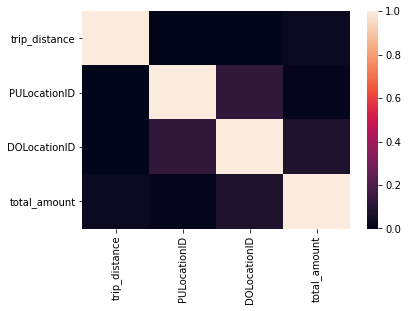

In [47]:
# Heat Map to determine correlation between distance and fare
sns.heatmap(data[['trip_distance','PULocationID','DOLocationID','total_amount']].corr())


In [48]:
# Plotting Average Distance covered for different days in a week
uber_dt = data[data['cab_type']=='Uber'].groupby('Day')['trip_distance'].mean()
uber_dt = uber_dt.reindex(index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday','Saturday','Sunday'])
lyft_dt = data[data['cab_type']=='Lyft'].groupby('Day')['trip_distance'].mean()
lyft_dt = lyft_dt.reindex(index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday','Saturday','Sunday'])
yellow_dt = data[data['cab_type']=='yellow'].groupby('Day')['trip_distance'].mean()
yellow_dt = yellow_dt.reindex(index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday','Saturday','Sunday'])


In [49]:
fig = go.Figure()
fig.add_trace(go.Bar(x=uber_dt.index, y=uber_dt.values,
            
                    name='Uber'))
fig.add_trace(go.Bar(x=lyft_dt.index, y=lyft_dt.values,
                    
                    name='Lyft'))
fig.add_trace(go.Bar(x=yellow_dt.index, y=yellow_dt.values,
                
                    name='Yellow'))
fig.update_layout(barmode='group',
    title="Average Daily Distance travelled ",
    xaxis_title="Days",
    yaxis_title="Average Distance Covered",
    legend_title="Cab Type",

)
fig.show()

In [4]:
#Dropping unwanted weather columns
weather.drop(['snow','wpgt','wdir','tsun','pres'],axis=1,inplace=True)

In [51]:
weather.dtypes


date     object
tavg    float64
tmin    float64
tmax    float64
prcp    float64
wspd    float64
dtype: object

In [52]:
data.dtypes

pickup_datetime         datetime64[ns]
dropoff_datetime        datetime64[ns]
trip_distance                  float64
PULocationID                     int64
DOLocationID                     int64
base_passenger_fare            float64
tip_amount                     float64
total_amount                   float64
congestion_surcharge           float64
cab_type                        object
Month                           object
Day                             object
Hour                             int64
Date                            object
dtype: object

In [5]:
# Renaming column name of weather dataset
weather.rename(columns = {'date':'Date'}, inplace = True) 
#Converting Data types of both datasets
data['Date']=pd.to_datetime(data['Date'])
weather['Date']=pd.to_datetime(weather['Date'])

In [6]:
# Merging Datasets of weather and cabs
comb = data.merge(weather,on="Date",how="left")

In [55]:
comb

,pickup_datetime,dropoff_datetime,trip_distance,PULocationID,DOLocationID,base_passenger_fare,tip_amount,total_amount,congestion_surcharge,cab_type,Month,Day,Hour,Date,tavg,tmin,tmax,prcp,wspd
0,2022-01-01 00:35:40,2022-01-01 00:53:29,3.800,142,236,14.50,3.65,18.30,2.50,yellow,January,Saturday,0,2022-01-01,9.7,6.4,11.6,24.0,7.8
1,2022-01-01 00:33:43,2022-01-01 00:42:07,2.100,236,42,8.00,4.00,9.30,0.00,yellow,January,Saturday,0,2022-01-01,9.7,6.4,11.6,24.0,7.8
2,2022-01-01 00:53:21,2022-01-01 01:02:19,0.970,166,166,7.50,1.76,8.80,0.00,yellow,January,Saturday,0,2022-01-01,9.7,6.4,11.6,24.0,7.8
3,2022-01-01 00:25:21,2022-01-01 00:35:23,1.090,114,68,8.00,0.00,11.80,2.50,yellow,January,Saturday,0,2022-01-01,9.7,6.4,11.6,24.0,7.8
4,2022-01-01 00:36:48,2022-01-01 01:14:20,4.300,68,163,23.50,3.00,27.30,2.50,yellow,January,Saturday,0,2022-01-01,9.7,6.4,11.6,24.0,7.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58282222,2022-03-31 23:56:47,2022-04-01 00:09:52,3.740,112,233,18.39,0.00,29.90,2.75,Uber,March,Thursday,23,2022-03-31,13.1,4.9,17.9,3.0,24.7
58282223,2022-03-31 23:08:34,2022-03-31 23:22:32,1.950,231,158,18.35,0.00,22.73,2.75,Uber,March,Thursday,23,2022-03-31,13.1,4.9,17.9,3.0,24.7
58282224,2022-03-31 23:25:20,2022-03-31 23:33:51,2.000,158,48,19.38,0.00,23.85,2.75,Uber,March,Thursday,23,2022-03-31,13.1,4.9,17.9,3.0,24.7
58282225,2022-03-31 23:47:18,2022-04-01 00:01:57,2.590,85,91,13.40,0.00,14.59,0.00,Uber,March,Thursday,23,2022-03-31,13.1,4.9,17.9,3.0,24.7


In [56]:
comb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58282227 entries, 0 to 58282226
Data columns (total 19 columns):
 #   Column                Dtype         
---  ------                -----         
 0   pickup_datetime       datetime64[ns]
 1   dropoff_datetime      datetime64[ns]
 2   trip_distance         float64       
 3   PULocationID          int64         
 4   DOLocationID          int64         
 5   base_passenger_fare   float64       
 6   tip_amount            float64       
 7   total_amount          float64       
 8   congestion_surcharge  float64       
 9   cab_type              object        
 10  Month                 object        
 11  Day                   object        
 12  Hour                  int64         
 13  Date                  datetime64[ns]
 14  tavg                  float64       
 15  tmin                  float64       
 16  tmax                  float64       
 17  prcp                  float64       
 18  wspd                  float64       
dty

In [7]:
#Plotting temperature vs mean fare
ubert = comb[comb['cab_type']=='Uber'].groupby('tavg')['total_amount'].mean()
lyftte = comb[comb['cab_type']=='Lyft'].groupby('tavg')['total_amount'].mean()
yellowte = comb[comb['cab_type']=='yellow'].groupby('tavg')['total_amount'].mean()

In [8]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=ubert.index, y=ubert.values,
                    mode='lines',
                    name='Uber'))
fig.add_trace(go.Scatter(x=lyftte.index, y=lyftte.values,
                    mode='lines',
                    name='Lyft'))
fig.add_trace(go.Scatter(x=yellowte.index, y=yellowte.values,
                    mode='lines',
                    name='Yellow'))
fig.update_layout(
    title="Average Fare With Respect to Temperature",
    xaxis_title="Average Temperature",
    yaxis_title="Average Fare ",
    legend_title="Cab Type",

)
fig.show()

In [45]:
#Plotting Average Fare when it's raining
precub = comb[comb['cab_type']=='Uber'].groupby('prcp')['total_amount'].mean()
preclyf = comb[comb['cab_type']=='Lyft'].groupby('prcp')['total_amount'].mean()
precyel = comb[comb['cab_type']=='yellow'].groupby('prcp')['total_amount'].mean()



In [50]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=precub.index, y=precub.values,
                    mode='lines',
                    name='Uber'))
fig.add_trace(go.Scatter(x=preclyf.index, y=preclyf.values,
                    mode='lines',
                    name='Lyft'))
fig.add_trace(go.Scatter(x=precyel.index, y=precyel.values,
                    mode='lines',
                    name='Yellow'))
fig.update_layout(
    title="Average Fare With Respect to Precipitation",
    xaxis_title="Precipitation mm",
    yaxis_title="Average Fare ",
    legend_title="Cab Type",

)
fig.show()

In [51]:
#Congestion surcharge when raining
ubcon = comb[comb['cab_type']=='Uber'].groupby('prcp')['congestion_surcharge'].mean()
lyfcon = comb[comb['cab_type']=='Lyft'].groupby('prcp')['congestion_surcharge'].mean()
yelcon = comb[comb['cab_type']=='yellow'].groupby('prcp')['congestion_surcharge'].mean()



In [53]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=ubcon.index, y=ubcon.values,
                    mode='lines',
                    name='Uber'))
fig.add_trace(go.Scatter(x=lyfcon.index, y=lyfcon.values,
                    mode='lines',
                    name='Lyft'))
fig.add_trace(go.Scatter(x=yelcon.index, y=yelcon.values,
                    mode='lines',
                    name='Yellow'))
fig.update_layout(
    title="Congestion Surcharge With Respect to Precipitation",
    xaxis_title="Precipitation mm",
    yaxis_title="Congestion Surcharge ",
    legend_title="Cab Type",

)
fig.show()

In [49]:
# Ridership during different prcp
ubridtem = comb[comb['cab_type'] == 'Uber']['prcp'].value_counts()
lyfatem = comb[comb['cab_type'] == 'Lyft']['prcp'].value_counts()
yelatem = comb[comb['cab_type'] == 'yellow']['prcp'].value_counts()



In [50]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=ubridtem.index, y=ubridtem.values,
                  mode='lines',
                    name='Uber'))
fig.add_trace(go.Scatter(x=lyfatem.index, y=lyfatem.values,
                      mode='lines',
                    name='Lyft'))
fig.add_trace(go.Scatter(x=yelatem.index, y=yelatem.values,
                       mode='lines',
                    name='Yellow'))
fig.update_layout(
    title="Ridership With Respect to Rainfall",
    xaxis_title="Precipitation mm",
    yaxis_title="Total Rides ",
    legend_title="Cab Type",

)
fig.show()

In [20]:
 data[data['cab_type']=='Lyft']['base_passenger_fare'].mean()


20.454438425227874

In [21]:
 data[data['cab_type']=='yellow']['base_passenger_fare'].mean()


13.205394503937116

In [4]:
 data[data['cab_type']=='yellow']['DOLocationID'].value_counts()

236    420352
237    378542
161    308820
170    273731
141    265809
        ...  
84         40
204        28
2           9
105         7
99          6
Name: DOLocationID, Length: 261, dtype: int64

In [5]:
 data[data['cab_type']=='Uber']['DOLocationID'].value_counts()

265    1272824
132     619734
138     538556
79      481080
61      473034
        ...   
99         969
8          574
110         74
2           53
105         13
Name: DOLocationID, Length: 261, dtype: int64

In [6]:
 data[data['cab_type']=='Lyft']['DOLocationID'].value_counts()

265    523666
61     236775
138    232062
132    204970
37     186502
        ...  
8         364
99        268
110        16
2          16
105        10
Name: DOLocationID, Length: 261, dtype: int64

In [7]:
 data[data['cab_type']=='Uber']['PULocationID'].value_counts()

79     564837
132    528438
138    494970
231    470410
61     459631
        ...  
110        30
1          14
199         5
105         3
264         1
Name: PULocationID, Length: 263, dtype: int64

In [8]:
 data[data['cab_type']=='Lyft']['PULocationID'].value_counts()

61     227642
79     216524
138    203898
132    190599
37     183169
        ...  
27        229
2          36
199        24
110         9
105         3
Name: PULocationID, Length: 261, dtype: int64

In [9]:
 data[data['cab_type']=='yellow']['PULocationID'].value_counts()

237    432539
236    407951
132    362331
161    355191
186    296053
        ...  
105         3
27          2
251         2
99          1
84          1
Name: PULocationID, Length: 260, dtype: int64

In [73]:
data['DOLocationID'].value_counts()

265    1809066
132     898681
79      868629
138     851794
161     839048
        ...   
99        1242
8         1110
110         90
2           76
105         29
Name: DOLocationID, Length: 262, dtype: int64

In [13]:
data['PULocationID'].value_counts()

132    1081368
79     1026770
138     926738
161     889568
230     857365
        ...   
99        1055
2           86
110         39
199         29
105          9
Name: PULocationID, Length: 263, dtype: int64

In [9]:
data['DOLocationID'].value_counts()

265    1823198
132     906168
79      870115
138     853624
161     840827
        ...   
99        1243
8         1119
110         90
2           78
105         30
Name: DOLocationID, Length: 262, dtype: int64